In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.ensemble import IsolationForest
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, precision_recall_curve, auc,roc_auc_score,average_precision_score

from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

In [2]:
# https://www.kaggle.com/code/sumeetsawant/credit-card-anomaly-detection-unsupervised/notebook

In [3]:
train_df = pd.read_csv('../dataset/train.csv')
val_df = pd.read_csv('../dataset/val.csv')
test_df = pd.read_csv('../dataset/test.csv')

In [4]:
# scaler = StandardScaler()
# scaler = RobustScaler()

In [5]:
# scaler에 dataframe이 들어갈 경우 각 column별로 적용이 됨을 확인함, 확실치 않을 경우 column별로 진행할 것.
# val_df[val_df.columns.values[1:-1]] = scaler.fit_transform(val_df[val_df.columns.values[1:-1]])
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler
col=[col for col in val_df.columns if col not in ['ID','Class']]

for i in col:
    sc=RobustScaler()
    val_df[i]=sc.fit_transform(val_df[i].values.reshape(-1,1))

In [6]:
val_df.describe()

,ID,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V22,V23,V24,V25,V26,V27,V28,V29,V30,Class
count,28462.000000,28462.000000,2.846200e+04,28462.000000,28462.000000,28462.000000,28462.000000,2.846200e+04,28462.000000,28462.000000,...,2.846200e+04,28462.000000,2.846200e+04,28462.000000,2.846200e+04,2.846200e+04,2.846200e+04,28462.000000,28462.000000,28462.000000
mean,142549.840138,-0.008345,-5.241178e-02,-0.092524,0.014773,0.037642,0.228273,-3.658564e-02,-0.025429,0.049810,...,-6.702122e-03,0.041963,-4.878475e-02,-0.021332,8.794698e-02,-6.262654e-03,-9.312708e-02,0.913665,0.117794,0.001054
std,82252.851474,0.865329,1.145330e+00,0.795798,0.882909,1.029633,1.121533,1.046732e+00,2.063545,0.880374,...,6.736630e-01,1.918602,7.599500e-01,0.780506,8.509984e-01,2.450379e+00,2.284694e+00,3.330221,0.558406,0.032449
min,10.000000,-13.239952,-2.738519e+01,-16.105990,-3.172894,-16.598967,-13.792802,-2.806863e+01,-49.180487,-7.583077,...,-7.998044e+00,-82.689425,-3.588172e+00,-8.965157,-2.715360e+00,-6.087525e+01,-6.289799e+01,-0.311381,-0.997321,0.000000
25%,71260.000000,-0.420918,-4.805677e-01,-0.556518,-0.522043,-0.497585,-0.428905,-5.323528e-01,-0.436748,-0.464976,...,-5.145980e-01,-0.486264,-4.943684e-01,-0.501879,-4.898380e-01,-4.492266e-01,-4.842868e-01,-0.231312,-0.360144,0.000000
50%,142683.500000,0.000000,-4.950908e-18,0.000000,0.000000,0.000000,0.000000,-3.117081e-18,0.000000,0.000000,...,8.131516e-19,0.000000,4.374078e-18,0.000000,6.091861e-18,1.685596e-19,6.511989e-18,0.000000,0.000000,0.000000
75%,213612.750000,0.579082,5.194323e-01,0.443482,0.477957,0.502415,0.571095,4.676472e-01,0.563252,0.535024,...,4.854020e-01,0.513736,5.056316e-01,0.498121,5.101620e-01,5.507734e-01,5.157132e-01,0.768688,0.639856,0.000000
max,284806.000000,1.070404,1.171731e+01,2.149187,7.625753,18.815211,10.770565,2.352987e+01,23.203133,6.459721,...,5.680035e+00,61.850933,4.559176e+00,8.160258,5.472269e+00,5.412785e+01,1.179924e+02,165.083440,1.033116,1.000000


In [7]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

X2D = pca.fit_transform(val_df.drop(columns=['ID', 'Class']))
X2D = pd.DataFrame(X2D, columns=['pca1', 'pca2'])
X2D['Class'] = val_df['Class']
X2D.head()

,pca1,pca2,Class
0,-1.034767,-1.567597,0
1,-0.992193,-0.018787,0
2,-0.872695,0.366276,0
3,-0.773362,-0.211483,0
4,0.951739,1.889111,0


In [8]:
pca.explained_variance_ratio_

array([0.23684121, 0.10854977])

In [9]:
sample = X2D.sample(frac=1)

In [10]:
# plt.scatter(samp['pca1'],samp['pca2'],c=samp['Class'],alpha=0.1);
# plt.title('PCA for abnormality detection');
# plt.xlabel('PCA_1');
# plt.ylabel('PCA_2');

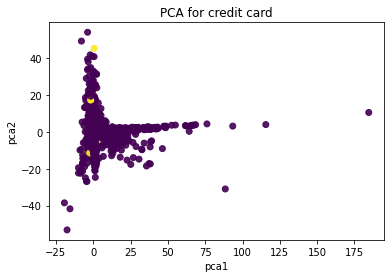

In [11]:
plt.scatter(sample['pca1'], sample['pca2'], c=sample['Class'], alpha=0.9);
plt.title('PCA for credit card');
plt.xlabel('pca1');
plt.ylabel('pca2');


In [12]:
from sklearn.decomposition import PCA
scaler = PCA(n_components=3)

X3D = scaler.fit_transform(val_df.drop(columns=['ID', 'Class']))
X3D = pd.DataFrame(X3D, columns=['pca1', 'pca2', 'pca3'])
X3D['Class'] = val_df['Class']
X3D.head()

,pca1,pca2,pca3,Class
0,-1.034781,-1.567090,0.747979,0
1,-0.992121,-0.018370,-0.002190,0
2,-0.872629,0.367035,0.094023,0
3,-0.773303,-0.211479,0.007767,0
4,0.951666,1.890344,-6.603076,0


In [13]:
sample = X3D.sample(frac=1)

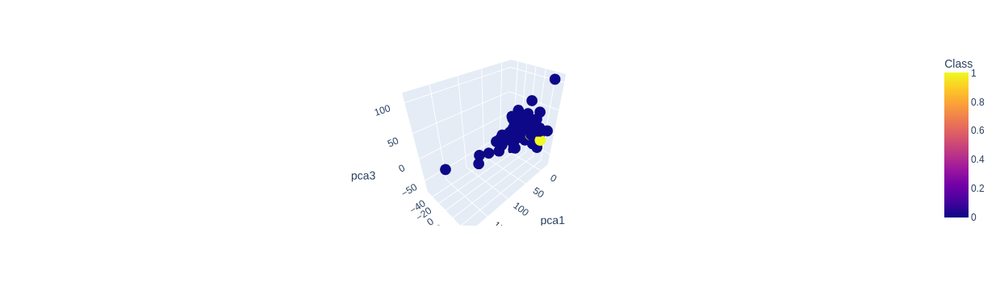

In [14]:
import plotly.express as px
fig = px.scatter_3d(sample, x='pca1', y='pca2', z='pca3', color='Class')
fig.show()

In [15]:
u, s, v = np.linalg.svd(val_df.drop(columns=['ID', 'Class']).to_numpy(), full_matrices=False)

In [16]:
s

array([632.71080562, 415.42861446, 391.17478896, 349.55904855,
       327.4408256 , 306.28717891, 274.48640841, 195.57249886,
       186.41387278, 182.92551559, 181.48479481, 174.81736998,
       167.42652838, 157.08809656, 151.44034698, 150.06147359,
       149.75956407, 148.04998542, 146.12570086, 145.60854335,
       143.64982191, 138.4660174 , 131.5848422 , 129.54759592,
       128.23558124, 126.55516254, 116.88749042, 113.61109349,
        62.30949651,  51.53836932])

In [17]:
s[0] = 0

In [18]:
print(u.shape)
print(s.shape)
print(v.shape)

(28462, 30)
(30,)
(30, 30)


In [19]:
val = pd.DataFrame(u @ np.diag(s) @ v)
# val['Class'] = val_df['Class']
val.head()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,-0.169402,0.719528,0.454342,-0.123010,0.412358,0.040089,0.558010,0.078286,-0.541666,-0.272467,...,-0.514256,-0.601810,-0.364501,-0.536057,-0.129289,0.253209,1.523855,0.533228,-0.113640,-0.996503
1,0.419024,0.174148,-0.185901,1.339641,0.908438,1.718326,0.058742,0.930514,-0.907902,0.828605,...,0.422870,0.367511,-0.123034,-1.779021,0.553926,0.438246,0.097848,-0.200649,0.199133,-0.997022
2,0.503662,0.359291,0.010396,1.645806,-0.028919,-0.663990,0.434416,-0.493570,-0.669493,0.863538,...,0.096775,-0.119402,-0.211679,0.820554,0.914620,0.172502,-0.333259,0.030822,0.146819,-0.997035
3,0.412828,-0.256991,0.119535,0.352408,0.245695,1.664461,-0.441228,1.118717,0.237319,-0.123493,...,-0.040162,0.068569,0.360566,-1.300554,0.102732,0.748686,0.225148,-0.136539,0.163960,-0.997803
4,-1.271962,2.103312,0.771613,-1.541790,0.436263,-0.597621,1.645409,-3.351078,3.299579,6.230598,...,-2.136708,-0.152143,-0.408067,0.604596,0.192269,0.884833,-1.523262,-8.400651,-2.028903,-1.006514


In [20]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X2D = pca.fit_transform(val)
X2D = pd.DataFrame(X2D, columns=['pca1', 'pca2'])
X2D['Class'] = val_df['Class']

In [21]:
X2D.head()

,pca1,pca2,Class
0,-1.568378,0.735247,0
1,-0.019747,-0.016971,0
2,0.365526,0.081072,0
3,-0.212231,-0.002463,0
4,1.889311,-6.584838,0


In [22]:
print(pca.explained_variance_ratio_)

[0.14219502 0.12573371]


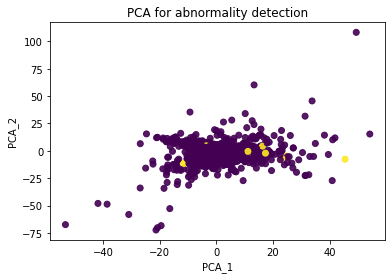

In [23]:
samp = X2D.sample(frac=1)
plt.scatter(samp['pca1'],samp['pca2'],c=samp['Class'],alpha=0.9);
plt.title('PCA for abnormality detection');
plt.xlabel('PCA_1');
plt.ylabel('PCA_2');

In [24]:
from sklearn.decomposition import PCA 

pca=PCA(n_components=3)
X3D=pca.fit_transform(val)

X3D=pd.DataFrame(X3D,columns=['pca1','pca2','pca3'])
X3D['Class']=val_df['Class']

# We can change the frac value to reduce the points plotted 
samp=X3D.sample(frac=1)

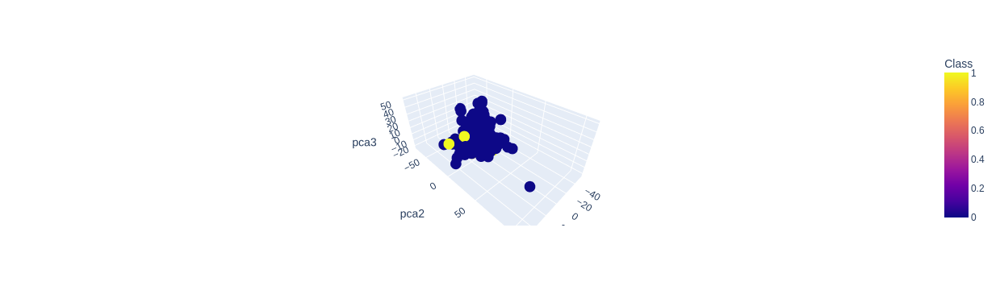

In [25]:
import plotly.express as px
fig = px.scatter_3d(samp, x='pca1', y='pca2', z='pca3',
              color='Class')
fig.show()

In [34]:
u, s, v = np.linalg.svd(val_df.drop(columns=['ID', 'Class']).to_numpy(), full_matrices=False)
s

array([632.71080562, 415.42861446, 391.17478896, 349.55904855,
       327.4408256 , 306.28717891, 274.48640841, 195.57249886,
       186.41387278, 182.92551559, 181.48479481, 174.81736998,
       167.42652838, 157.08809656, 151.44034698, 150.06147359,
       149.75956407, 148.04998542, 146.12570086, 145.60854335,
       143.64982191, 138.4660174 , 131.5848422 , 129.54759592,
       128.23558124, 126.55516254, 116.88749042, 113.61109349,
        62.30949651,  51.53836932])

In [43]:
s[0:6] = 0
s

array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        , 62.30949651, 51.53836932])

In [44]:
val = pd.DataFrame(u @ np.diag(s) @ v)
# val['Class'] = val_df['Class']
val.head()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,0.104922,0.094245,-0.113466,-0.064911,0.126611,-0.054869,-0.055842,0.004646,0.005863,0.029319,...,-0.004492,0.103201,0.018397,-0.011017,-0.091876,-0.011661,-0.002478,-0.005803,0.056720,-0.479168
1,0.057364,0.044765,-0.082934,-0.037276,0.068951,-0.027961,-0.023667,0.001454,0.002675,0.016236,...,-0.000981,0.062133,0.009983,-0.007165,-0.060956,-0.007012,-0.001347,-0.003220,0.027523,-0.305658
2,0.112151,0.103883,-0.111567,-0.068553,0.135461,-0.059598,-0.062882,0.005471,0.006513,0.031243,...,-0.005487,0.107657,0.019699,-0.011245,-0.093220,-0.012168,-0.002652,-0.006181,0.062250,-0.491873
3,0.051537,0.039906,-0.075474,-0.033572,0.061934,-0.025026,-0.020946,0.001256,0.002379,0.014597,...,-0.000813,0.056085,0.008966,-0.006490,-0.055259,-0.006329,-0.001210,-0.002895,0.024566,-0.276625
4,0.029729,-0.018491,-0.171828,-0.030333,0.034056,-0.001923,0.030057,-0.005943,-0.001882,0.009687,...,0.008584,0.067399,0.004712,-0.010752,-0.097708,-0.007561,-0.000650,-0.001963,-0.007241,-0.427713


In [45]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X2D = pca.fit_transform(val)
X2D = pd.DataFrame(X2D, columns=['pca1', 'pca2'])
X2D['Class'] = val_df['Class']

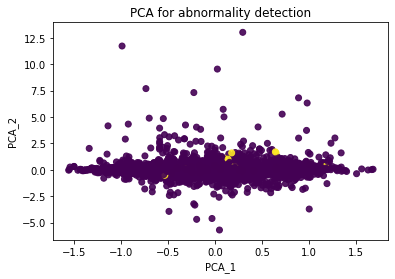

In [46]:
samp = X2D.sample(frac=1)
plt.scatter(samp['pca1'],samp['pca2'],c=samp['Class'],alpha=0.9);
plt.title('PCA for abnormality detection');
plt.xlabel('PCA_1');
plt.ylabel('PCA_2');

In [47]:
from sklearn.decomposition import PCA 

pca=PCA(n_components=3)
X3D=pca.fit_transform(val)

X3D=pd.DataFrame(X3D,columns=['pca1','pca2','pca3'])
X3D['Class']=val_df['Class']

# We can change the frac value to reduce the points plotted 
samp=X3D.sample(frac=1)

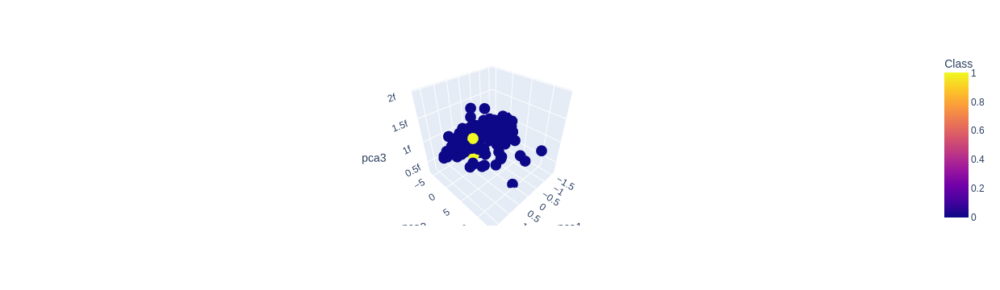

In [48]:
import plotly.express as px
fig = px.scatter_3d(samp, x='pca1', y='pca2', z='pca3',
              color='Class')
fig.show()